# Define the model

In [1]:
import pandas as pd
import numpy as np
import torch
import torch.optim as optim
import torch.nn as nn
import torchvision
from torchvision import models
import matplotlib.pyplot as plt
import albumentations as A
from albumentations.pytorch import ToTensorV2
import os
from torchvision import models
from torch import Tensor
from typing import Iterable, Callable, Dict
import torch.nn.functional as F

/usr/local/anaconda3/envs/ml3/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
with open("../data/num_styles.txt", "r") as f:
    num_classes = int(f.readline())
    print("Number of Styles:", num_classes)

Number of Styles: 27


In [3]:
# import tarfile

# # Extract entire wikiart dataset
# with tarfile.open("../wikiart.tar") as tar:
#     tar.extractall('../')

In [4]:
mean = pd.read_csv("../data/wikiart_mean.csv", header=None).to_numpy()[0]
std = pd.read_csv("../data/wikiart_std.csv", header=None).to_numpy()[0]
wikiart_location = "../wikiart/"

class Transforms:
    def __init__(self, transforms: A.Compose):
        self.transforms = transforms

    def __call__(self, img, *args, **kwargs):
        return self.transforms(image=np.array(img))["image"]


# Using albumentations library
transforms = A.Compose(
    [
        A.PadIfNeeded(min_height=256, min_width=256),
        A.SmallestMaxSize(max_size=256),
        A.CenterCrop(height=224, width=224),
        A.Normalize(mean=mean, std=std),
        ToTensorV2(),
    ]
)

train = torchvision.datasets.ImageFolder(
    root=wikiart_location, transform=Transforms(transforms)
)
print("Number of images", len(train.imgs))
full_loader = torch.utils.data.DataLoader(train, batch_size=64)

wikiart_df = pd.read_csv('../wikiart/wclasses.csv')
wikiart_df[['style_name', 'file']] = wikiart_df['file'].str.split('/', expand=True)
print('Preview of df', wikiart_df.head())

Number of images 81444
Preview of df                                                 file  artist  genre  style  \
0    vincent-van-gogh_pine-trees-in-the-fen-1884.jpg      22    133    161   
1  rembrandt_the-angel-appearing-to-the-shepherds...      20    136    144   
2      paul-cezanne_portrait-of-the-artist-s-son.jpg      16    135    160   
3  pierre-auguste-renoir_young-girl-seated-in-a-m...      17    131    152   
4                   ivan-aivazovsky_morning-1851.jpg       9    139    163   

           style_name  
0             Realism  
1             Baroque  
2  Post_Impressionism  
3       Impressionism  
4         Romanticism  


In [5]:
has_mps = hasattr(torch, "has_mps") and torch.has_mps
cuda = torch.cuda.is_available()

device = None
if has_mps:
    print("MPS can be utilized")
    device = torch.device("mps")

MPS can be utilized


In [6]:
class PretrainedFeatureExtractor(nn.Module):
    def __init__(
        self,
        model: nn.Module,
        layers: Iterable[str],
        model_name: str,
        num_classes: int,
        classification_extraction=None,
        filter_condition=None,
    ):
        super().__init__()
        # freezing parameters
        if filter_condition is not None:
            for name, param in model.named_parameters():
                if filter_condition(name):
                    continue
                else:
                    param.requires_grad_ = False

        self.model = model
        self.model.aux_logits = False
        num_features = self.model.fc.in_features
        self.fc = nn.Linear(num_features, num_classes)
        self.layers = layers
        self.model_name = model_name
        self._classification_extraction = classification_extraction
        self._features = {layer: torch.empty(0) for layer in layers}

        for layer_id in layers:
            layer = dict([*self.model.named_modules()])[layer_id]
            layer.register_forward_hook(self.save_outputs_hook(layer_id))

    def save_outputs_hook(self, layer_id: str) -> Callable:
        def fn(_, __, output):
            self._features[layer_id] = output

        return fn

    def forward(self, x: Tensor) -> Dict[str, Tensor]:
        x = self.model(x)

        # Certain pre-defined models return more than just the resulting probabilities
        if self._classification_extraction is not None:
            x = self._classification_extraction(x)

        return x, self._features

In [7]:
class PretrainedCustomResNet(nn.Module):
    def __init__(
        self,
        resnet: models.ResNet,
        num_classes: int,
        model_name: str,
        named_layers: Iterable[str] = ['4', '5', '6', '7'],
        filter_condition=lambda x: "layer4" in x or "fc" in x,
        batch_norm: int = 512,
    ):
        super(PretrainedCustomResNet, self).__init__()
        # freezing parameters
        for name, param in resnet.named_parameters():
            if filter_condition(name):
                continue
            else:
                param.requires_grad_ = False
        # convolutional layers of resnet34
        layers = list(resnet.children())[:8]
        self.top_model = nn.Sequential(*layers)
        print('dict', dict([*self.top_model.named_modules()]))
        # print('dict', dict([*self.top_model.named_modules()]))
        self.bn1 = nn.BatchNorm1d(batch_norm)
        self.bn2 = nn.BatchNorm1d(512)
        self.fc1 = nn.Linear(batch_norm, 512)
        self.fc2 = nn.Linear(512, num_classes)
        self.model_name = model_name
        self._features = {layer: torch.empty(0) for layer in named_layers}

        for layer_id in named_layers:
            layer = dict([*self.top_model.named_modules()])[layer_id]
            layer.register_forward_hook(self.save_outputs_hook(layer_id))

    def save_outputs_hook(self, layer_id: str) -> Callable:
        def fn(_, __, output):
            self._features[layer_id] = output

        return fn

    def forward(self, x):
        x = F.relu(self.top_model(x))
        x = nn.AdaptiveAvgPool2d((1, 1))(x)
        x = x.view(x.shape[0], -1)  # flattening
        x = self.bn1(x)
        x = F.relu(self.fc1(x))
        x = self.bn2(x)
        x = self.fc2(x)
        return x, self._features

In [8]:
def load_model(m, p):
    m.load_state_dict(torch.load(p))

# ResNet 50 Model

In [9]:
# model_name = 'PretrainedCustomResNet50_Last2Layers'
# feature_layer = "7"
# filename_suffix = "_half"
# embedding = torch.randn((1, 2048, 7, 7))

# feature_model = PretrainedCustomResNet(
#     resnet=models.resnet50(weights="ResNet50_Weights.DEFAULT"),
#     num_classes=num_classes,
#     model_name=model_name,
#     filter_condition=lambda x: "layer3" in x or "layer4" in x or "fc" in x,
#     batch_norm=2048,
# )

# if cuda:
#     feature_model.cuda()
# elif has_mps:
#     feature_model = feature_model.to(device)

# print(feature_model)

# load_model(feature_model, str(f'../models/predefined/state/{model_name}_model{filename_suffix}.pth'))

# ResNet 101 Model

In [10]:
# model_name = 'PretrainedCustomResNet101_Last2Layers'
# feature_layer = "7"
# filename_suffix = "_half"
# embedding = torch.randn((1, 2048, 7, 7))

# feature_model = PretrainedCustomResNet(
#     resnet=models.resnet101(weights="ResNet101_Weights.DEFAULT"),
#     num_classes=num_classes,
#     model_name=model_name,
#     filter_condition=lambda x: "layer3" in x or "layer4" in x or "fc" in x,
#     batch_norm=2048,
# )

# if cuda:
#     feature_model.cuda()
# elif has_mps:
#     feature_model = feature_model.to(device)

# print(feature_model)

# load_model(feature_model, str(f'../models/predefined/state/{model_name}_model{filename_suffix}.pth'))

# ResNet 152 Model

In [11]:
model_name = 'PretrainedCustomResNet152_Last2Layers'
feature_layer = "7"
filename_suffix = "_full_2"
embedding = torch.randn((1, 2048, 7, 7))

feature_model = PretrainedCustomResNet(
    resnet=models.resnet152(weights="ResNet152_Weights.DEFAULT"),
    num_classes=num_classes,
    model_name=model_name,
    filter_condition=lambda x: "layer3" in x or "layer4" in x or "fc" in x,
    batch_norm=2048,
)

if cuda:
    feature_model.cuda()
elif has_mps:
    feature_model = feature_model.to(device)

print(feature_model)

load_model(feature_model, str(f'../models/predefined/state/{model_name}_model{filename_suffix}.pth'))

dict {'': Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bi

# GoogLeNet Model

In [12]:
# model_name = 'PretrainedCustomGoogleNet_Last2Layers'
# feature_layer = "inception5b"
# filename_suffix = "_half"
# embedding = torch.randn((1, 1024, 7, 7))

# feature_model = PretrainedFeatureExtractor(
#     model=models.googlenet(weights="GoogLeNet_Weights.DEFAULT"),
#     num_classes=num_classes,
#     model_name=model_name,
#     layers = ['inception3a', 'inception3b', 'inception4a', 'inception4b', 
#               'inception4c', 'inception4d', 'inception5a', 'inception5b'],
#     filter_condition=lambda x: "inception5a" in x or "inception5b" in x or "fc" in x,
# )

# if cuda:
#     feature_model.cuda()
# elif has_mps:
#     feature_model = feature_model.to(device)

# print(feature_model)

# load_model(feature_model, str(f'../models/predefined/state/{model_name}_model{filename_suffix}.pth'))

In [13]:
from tqdm import tqdm
feature_model.eval()

with torch.no_grad():
    total, correct = 0, 0

    pbar = tqdm(total=len(full_loader), position=0, leave=True)
    pbar.set_description(f'Batch -1/{len(full_loader)}; Accuracy: NA%')

    for batch_idx, (data, target) in enumerate(full_loader): # Change to Full Loader...
        if cuda:
            data = data.cuda()
        elif has_mps:
            data = data.to(device)

        out, feature_embedding = feature_model(data)
        out = out.cpu()
        feature_embedding = feature_embedding[feature_layer].cpu()
        embedding = torch.cat((embedding, feature_embedding), 0)

        _, predicted = out.max(1)
        total += target.size(0)
        correct += predicted.eq(target).sum().cpu().item()
        accuracy = 100.0 * correct / total

        pbar.set_description(f'Batch {batch_idx}/{len(full_loader)}; Accuracy: {round(accuracy, 3)}%')
        pbar.update()


embedding = embedding[1:]
 
numpy_embedding = embedding.cpu().detach().numpy()
num_images = numpy_embedding.shape[0]

flattened_embedding = numpy_embedding.reshape((num_images, -1))
print('Generated embedding', flattened_embedding.shape)

Batch 1272/1273; Accuracy: 82.123%: 100%|██████████| 1273/1273 [2:29:45<00:00, 12.96s/it]

Generated embedding (81444, 100352)


# Cluster images

In [14]:
import numpy as np
import pickle
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

pca = PCA(n_components=50)
reduced_embedding = pca.fit_transform(flattened_embedding)
print('Reduced Embedding', reduced_embedding.shape)

Reduced Embedding (81444, 50)


In [15]:
# Cluster in 2 dimensions
print("Using T-SNE to cluster them in 2 dimensions")
tsne_obj_2d = TSNE(
    n_components=2,
    verbose=1,
    n_iter=2000,
    n_jobs=-1,
)

tsne_embedding_2d = tsne_obj_2d.fit_transform(reduced_embedding)
print('TSNE Embedding', tsne_embedding_2d.shape)

Using T-SNE to cluster them in 2 dimensions
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 81444 samples in 0.020s...


/usr/local/anaconda3/envs/ml3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/anaconda3/envs/ml3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 81444 samples in 219.080s...
[t-SNE] Computed conditional probabilities for sample 1000 / 81444
[t-SNE] Computed conditional probabilities for sample 2000 / 81444
[t-SNE] Computed conditional probabilities for sample 3000 / 81444
[t-SNE] Computed conditional probabilities for sample 4000 / 81444
[t-SNE] Computed conditional probabilities for sample 5000 / 81444
[t-SNE] Computed conditional probabilities for sample 6000 / 81444
[t-SNE] Computed conditional probabilities for sample 7000 / 81444
[t-SNE] Computed conditional probabilities for sample 8000 / 81444
[t-SNE] Computed conditional probabilities for sample 9000 / 81444
[t-SNE] Computed conditional probabilities for sample 10000 / 81444
[t-SNE] Computed conditional probabilities for sample 11000 / 81444
[t-SNE] Computed conditional probabilities for sample 12000 / 81444
[t-SNE] Computed conditional probabilities for sample 13000 / 81444
[t-SNE] Computed conditional probabilities for sample 14000 / 814

# Visualize the clusters

In [16]:
import plotly.express as px

x = tsne_embedding_2d[:, 0]
y = tsne_embedding_2d[:, 1]

df = wikiart_df.copy()
df['x'] = x
df['y'] = y

fig = px.scatter(df, x='x', y='y', hover_data=['file'], color='style_name')

# Write to html
fig.write_html(f"output/{model_name}/image_clustering{filename_suffix}.html")
fig.write_image(f"output/{model_name}/image_clustering{filename_suffix}.jpg")

# Find similar images

In [17]:
# Determine artist and artwork title
def get_art_info(filename):
    artist = ' '.join(filename.split('_')[0].split('-')).title()
    title = ' '.join(filename.split('_')[1].replace('.jpg', '').split('-')).title()

    return artist, title

Attribution 0    High_Renaissance
Name: style_name, dtype: object
Image 0    leonardo-da-vinci_mona-lisa.jpg
Name: file, dtype: object
Predicted tensor([[23]])
['Abstract_Expressionism', 'Action_painting', 'Analytical_Cubism', 'Art_Nouveau_Modern', 'Baroque', 'Color_Field_Painting', 'Contemporary_Realism', 'Cubism', 'Early_Renaissance', 'Expressionism', 'Fauvism', 'High_Renaissance', 'Impressionism', 'Mannerism_Late_Renaissance', 'Minimalism', 'Naive_Art_Primitivism', 'New_Realism', 'Northern_Renaissance', 'Pointillism', 'Pop_Art', 'Post_Impressionism', 'Realism', 'Rococo', 'Romanticism', 'Symbolism', 'Synthetic_Cubism', 'Ukiyo_e']
Predicted Style ['Romanticism']


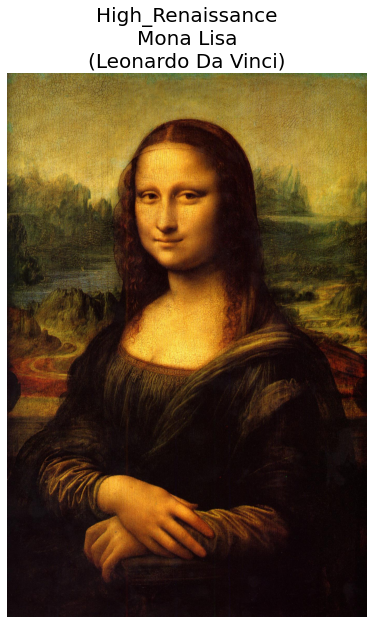

In [58]:
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from PIL import Image

number_of_images = 10
example_number = 5

# test_image = 'leonardo-da-vinci_portrait-of-ginevra-benci.jpg'
# test_image = 'claude-monet_the-custom-s-house.jpg'
# test_image = 'claude-monet_charing-cross-bridge-the-thames-02.jpg'
# test_image = 'claude-monet_vetheuil-barge-on-the-seine-1902.jpg'
test_image = 'leonardo-da-vinci_mona-lisa.jpg'
associated_info = wikiart_df[wikiart_df['file'] == test_image].reset_index()
print('Attribution', associated_info['style_name'])
print('Image', associated_info['file'])
image_style = associated_info['style_name'][0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
img = Image.open('../wikiart_train/' + image_style + '/' + test_image).convert("RGB")
ax.imshow(img)
artist, title = get_art_info(test_image)
ax.set_title(f'{image_style}\n{title}\n({artist})', fontsize=20)
ax.axis("off")

fig.savefig(f"output/{model_name}/original_image{filename_suffix}_{example_number}.jpg", dpi = 300, bbox_inches = 'tight')

image_tensor = transforms(image=np.array(img))['image']
image_tensor = image_tensor[None, :]
if cuda:
    image_tensor = image_tensor.cuda()
elif has_mps:
    image_tensor = image_tensor.to(device)

with torch.no_grad():
    out, features = feature_model(image_tensor)
    out = out.cpu()
    features = features[feature_layer].cpu()
    image_embedding = features.detach().numpy()
    _, predicted = out.topk(1, 1, True, True)
    print('Predicted', predicted)
    predicted_styles_num = predicted.t().numpy().reshape(-1)
    all_styles = full_loader.dataset.classes
    print(train.classes)
    predicted_styles = [all_styles[idx] for idx in predicted_styles_num]
    print('Predicted Style', predicted_styles)

# Recommendation System 1
Try just nearest neighbors on the images

In [59]:
flattened_image_embedding = image_embedding.reshape((1, -1))
all_images = full_loader.dataset.imgs
print('all images', len(all_images))
print('shape', np.asarray(flattened_embedding).shape)

knn = NearestNeighbors(n_neighbors=number_of_images, metric="cosine")
knn.fit(flattened_embedding)

_, indices = knn.kneighbors(flattened_image_embedding)
indices_list = indices.tolist()

indices = indices_list[0]

all images 81444
shape (81444, 100352)


Indicies [47976, 69291, 69345, 69195, 25083, 69371, 69328, 69367, 69255, 69206]
Image andy-warhol_pia-zadora-1980.jpg
Image dante-gabriel-rossetti_portrait-of-mrs-william-j-stillman-1869.jpg
Image dante-gabriel-rossetti_the-lady-of-pity-la-donna-della-finestra-1870.jpg
Image dante-gabriel-rossetti_alexa-wilding-1877-1.jpg
Image andrea-solario_salome-with-the-head-of-st-john-the-baptist-1507.jpg
Image dante-gabriel-rossetti_veronica-veronese-1872.jpg
Image dante-gabriel-rossetti_the-blue-bower-1865.jpg
Image dante-gabriel-rossetti_the-women-s-window-jane-morris-1880.jpg
Image dante-gabriel-rossetti_jane-morris-1870.jpg
Image dante-gabriel-rossetti_aurelia-1879.jpg


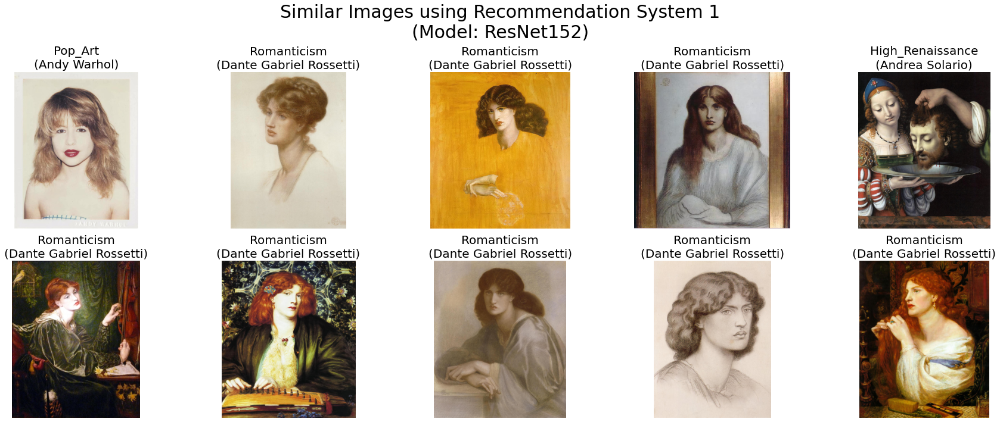

In [60]:
fig, ax = plt.subplots(2, 5, figsize=(25, 10))
fig.suptitle(f"Similar Images using Recommendation System 1\n(Model: {model_name.replace('PretrainedCustom', '').replace('_Last2Layers', '')})", fontsize=30)
print('Indicies', indices)

for idx, index in enumerate(indices):
    image_path = all_images[index][0]
    actual_image = image_path.split('/')[-1]
    print('Image', actual_image)
    image_info = wikiart_df[wikiart_df['file'] == actual_image].reset_index()
    image_style = image_info['style_name'][0]
    img_path = os.path.join(image_path)
    img = Image.open(img_path).convert("RGB")
    row, column = idx // 5, idx % 5
    artist, title = get_art_info(actual_image)
    ax[row, column].imshow(img)
    ax[row, column].set_title(f'{image_style}\n({artist})', fontsize=20)
    ax[row, column].axis("off")

fig.tight_layout()
plt.show()

fig.savefig(f"output/{model_name}/similar_images{filename_suffix}_{example_number}_system1.jpg", dpi = 300, bbox_inches = 'tight')

# Recommendation System 2
Try using the top 5 predicted categories, filter the existing images by those categories and then do nearest neighbors

In [61]:
_, predicted = out.topk(5, 1, True, True)
predicted_styles_num = predicted.t().numpy().reshape(-1)
print('Predicted', predicted)

all_styles = full_loader.dataset.classes
print('All styles', all_styles)
predicted_styles = [all_styles[idx] for idx in predicted_styles_num]
print('Predicted styles', predicted_styles)
all_images = full_loader.dataset.imgs
all_filtered_images = [(idx, image[0]) for idx, image in enumerate(all_images) if image[1] in predicted_styles_num]
# print('All Filtered images', all_filtered_images)
all_indicies = [idx for idx, _ in all_filtered_images]

flattened_image_embedding = image_embedding.reshape((1, -1))
filtered_flattened_embedding = [flattened_embedding[idx] for idx in all_indicies]
print('shape', np.asarray(filtered_flattened_embedding).shape)

knn = NearestNeighbors(n_neighbors=number_of_images, metric="cosine")
knn.fit(filtered_flattened_embedding)

_, indices = knn.kneighbors(flattened_image_embedding)
indices_list = indices.tolist()

indices = indices_list[0]

Predicted tensor([[23, 11, 22, 19, 18]])
All styles ['Abstract_Expressionism', 'Action_painting', 'Analytical_Cubism', 'Art_Nouveau_Modern', 'Baroque', 'Color_Field_Painting', 'Contemporary_Realism', 'Cubism', 'Early_Renaissance', 'Expressionism', 'Fauvism', 'High_Renaissance', 'Impressionism', 'Mannerism_Late_Renaissance', 'Minimalism', 'Naive_Art_Primitivism', 'New_Realism', 'Northern_Renaissance', 'Pointillism', 'Pop_Art', 'Post_Impressionism', 'Realism', 'Rococo', 'Romanticism', 'Symbolism', 'Synthetic_Cubism', 'Ukiyo_e']
Predicted styles ['Romanticism', 'High_Renaissance', 'Rococo', 'Pop_Art', 'Pointillism']
shape (12447, 100352)


Indicies [2073, 6205, 6259, 6109, 127, 6285, 6242, 6281, 6169, 6120]
Image andy-warhol_pia-zadora-1980.jpg
Image dante-gabriel-rossetti_portrait-of-mrs-william-j-stillman-1869.jpg
Image dante-gabriel-rossetti_the-lady-of-pity-la-donna-della-finestra-1870.jpg
Image dante-gabriel-rossetti_alexa-wilding-1877-1.jpg
Image andrea-solario_salome-with-the-head-of-st-john-the-baptist-1507.jpg
Image dante-gabriel-rossetti_veronica-veronese-1872.jpg
Image dante-gabriel-rossetti_the-blue-bower-1865.jpg
Image dante-gabriel-rossetti_the-women-s-window-jane-morris-1880.jpg
Image dante-gabriel-rossetti_jane-morris-1870.jpg
Image dante-gabriel-rossetti_aurelia-1879.jpg


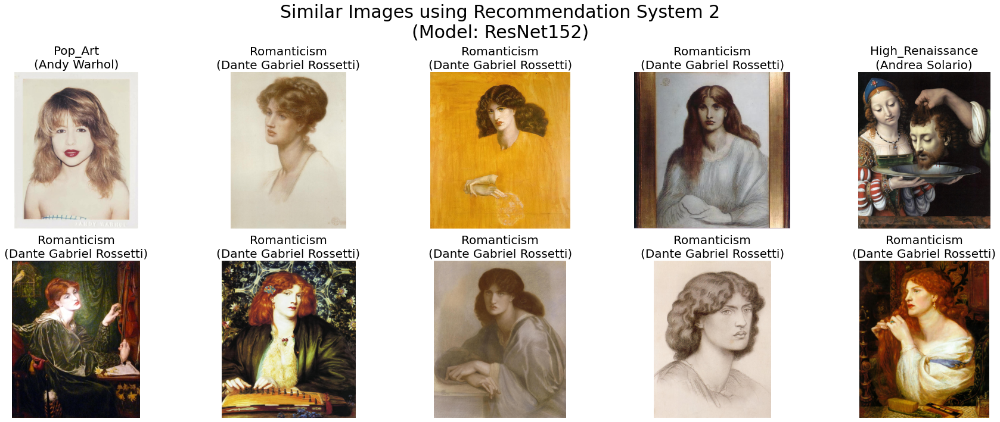

In [62]:
fig, ax = plt.subplots(2, 5, figsize=(25, 10))
fig.suptitle(f"Similar Images using Recommendation System 2\n(Model: {model_name.replace('PretrainedCustom', '').replace('_Last2Layers', '')})", fontsize=30)
print('Indicies', indices)

for idx, index in enumerate(indices):
    image_path = all_filtered_images[index][1]
    actual_image = image_path.split('/')[-1]
    print('Image', actual_image)
    image_info = wikiart_df[wikiart_df['file'] == actual_image].reset_index()
    image_style = image_info['style_name'][0]
    img_path = os.path.join(image_path)
    img = Image.open(img_path).convert("RGB")
    row, column = idx // 5, idx % 5
    artist, title = get_art_info(actual_image)
    ax[row, column].imshow(img)
    ax[row, column].set_title(f'{image_style}\n({artist})', fontsize=20)
    ax[row, column].axis("off")

fig.tight_layout()
plt.show()

fig.savefig(f"output/{model_name}/similar_images{filename_suffix}_{example_number}_system2.jpg", dpi = 300, bbox_inches = 'tight')

# Visualize image embeddings

In [63]:
def get_feature_maps(new_image_tensor):
    reduction = 'mean'
    processed_feature_maps, feature_map_names = [], []
    with torch.no_grad():
        _, features = feature_model(new_image_tensor)
        for extracted_feature_key in features.keys():
            feature_map = features[extracted_feature_key].cpu()
            feature_map = feature_map.squeeze(dim=0)
            num_filters = feature_map.shape[0]
            gray_scale = torch.sum(feature_map, dim=0) / num_filters
            processed_feature_maps.append(gray_scale.data.cpu().numpy())
            feature_map_names.append(extracted_feature_key)
        
        return processed_feature_maps, feature_map_names

In [64]:
import torchvision.transforms as T

images = ['claude-monet_vetheuil-barge-on-the-seine-1902.jpg', # Impressionism
          'john-singer-sargent_tarragona-1908.jpg', # Impressionism
          'pierre-auguste-renoir_chestnut-tree-blooming-1881.jpg', # Impressionism
          'leonardo-da-vinci_portrait-of-ginevra-benci.jpg', # Early Renaissance
          'sandro-botticelli_the-story-of-nastagio(1).jpg', # Early Renaissance
          'filippo-brunelleschi_crucifixion.jpg', # Early Renaissance
          'camille-pissarro_flock-of-sheep-1888.jpg', # Pointillism
          'georges-seurat_the-harbour-and-the-quays-at-port-en-bessin-1888.jpg', # Pointillism
          'theo-van-rysselberghe_anna-boch-in-her-studio.jpg', # Pointillism
          'michelangelo_sistine-chapel-ceiling-the-delphic-sibyl-1509.jpg', # High Renaissance
          'titian_portrait-of-a-man-in-a-red-cap-1516.jpg', # High Renaissance
          'leonardo-da-vinci_the-virgin-and-child-with-st-anne-1510.jpg', # High Renaissance
          'joan-hernandez-pijuan_marc-per-2000.jpg', # Minimalism
          'robert-mangold_curved-plane-figure-viii-1995.jpg', # Minimalism
          'sol-lewitt_summer-collage-1981.jpg', # Minimalism
]

resulting_maps = {}
resulting_style_map = {}
for image in images:
    associated_info = wikiart_df[wikiart_df['file'] == image].reset_index()
    image_style = associated_info['style_name'][0]
    original_image = Image.open(f'../wikiart_train/{image_style}/{image}').convert("RGB")
    image_tensor = transforms(image=np.array(original_image))['image']
    image_tensor = image_tensor[None, :]
    if cuda:
        image_tensor = image_tensor.cuda()
    elif has_mps:
        image_tensor = image_tensor.to(device)
    
    processed_feature_maps, feature_map_names = get_feature_maps(image_tensor)
    resulting_maps[image] = {
        "style": image_style,
        "image": original_image,
        "processed_feature_maps": processed_feature_maps,
        "feature_map_names": feature_map_names
    }
    if image_style in resulting_style_map:
        resulting_style_map[image_style].append({
            "image_name": image,
            "image": original_image,
            "processed_feature_maps": processed_feature_maps,
            "feature_map_names": feature_map_names
        })
    else:
        resulting_style_map[image_style] = [{
            "image_name": image,
            "image": original_image,
            "processed_feature_maps": processed_feature_maps,
            "feature_map_names": feature_map_names
        }]

claude-monet_vetheuil-barge-on-the-seine-1902.jpg


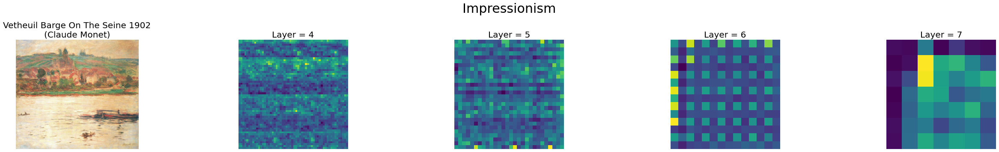

john-singer-sargent_tarragona-1908.jpg


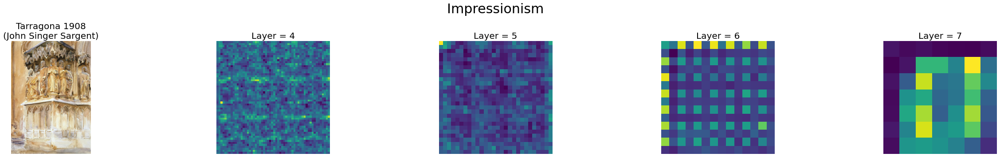

pierre-auguste-renoir_chestnut-tree-blooming-1881.jpg


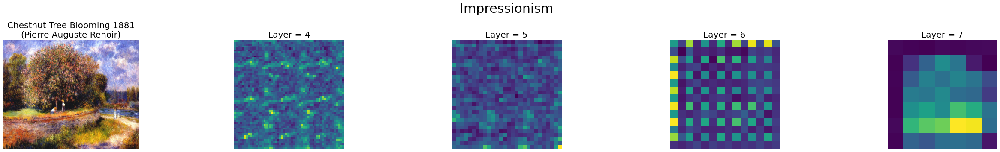

leonardo-da-vinci_portrait-of-ginevra-benci.jpg


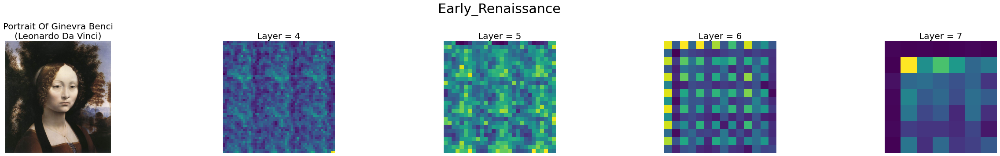

sandro-botticelli_the-story-of-nastagio(1).jpg


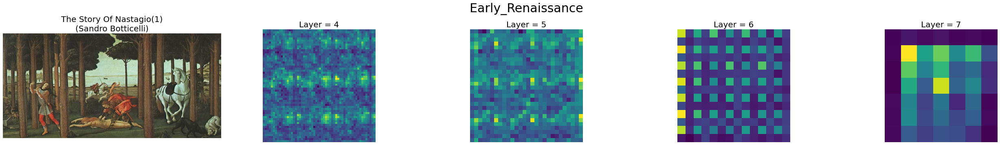

filippo-brunelleschi_crucifixion.jpg


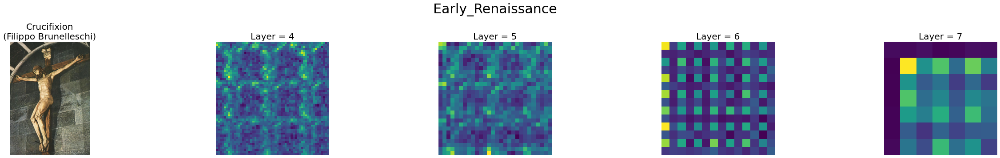

camille-pissarro_flock-of-sheep-1888.jpg


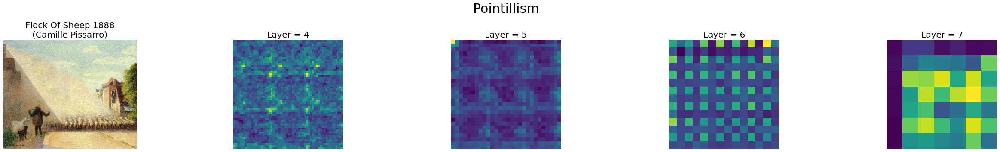

georges-seurat_the-harbour-and-the-quays-at-port-en-bessin-1888.jpg


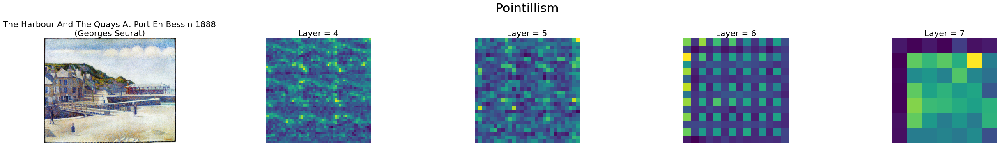

theo-van-rysselberghe_anna-boch-in-her-studio.jpg


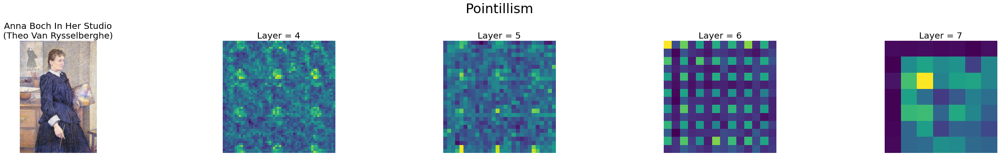

michelangelo_sistine-chapel-ceiling-the-delphic-sibyl-1509.jpg


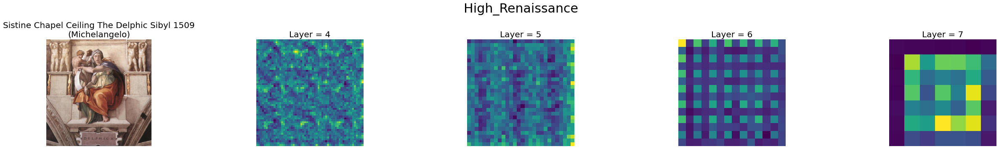

titian_portrait-of-a-man-in-a-red-cap-1516.jpg


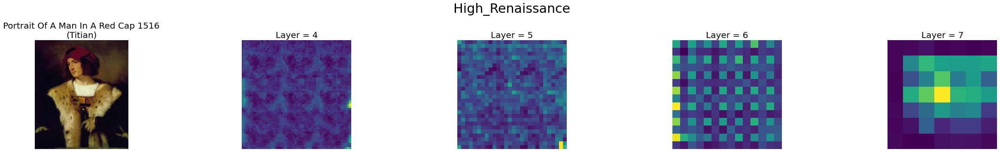

leonardo-da-vinci_the-virgin-and-child-with-st-anne-1510.jpg


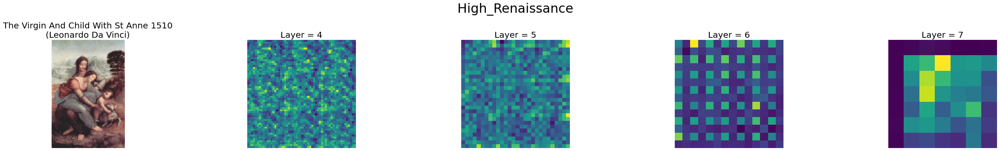

joan-hernandez-pijuan_marc-per-2000.jpg


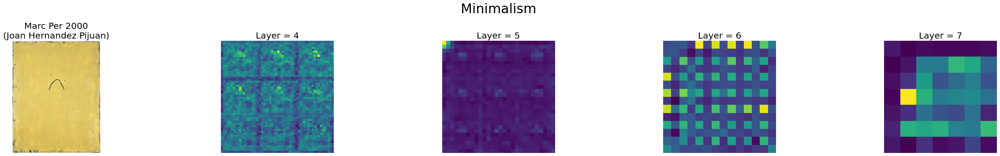

robert-mangold_curved-plane-figure-viii-1995.jpg


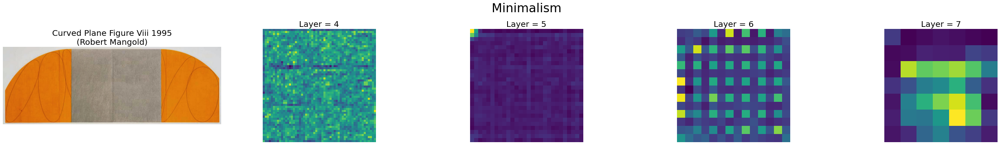

sol-lewitt_summer-collage-1981.jpg


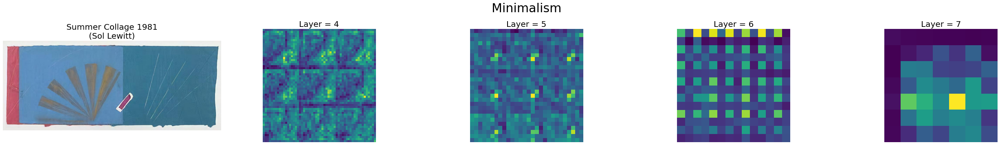

In [65]:
# Create viz
for idx, image in enumerate(resulting_maps.keys()):
    print(image)
    image_data = resulting_maps[image]
    feature_maps = image_data['processed_feature_maps']
    feature_map_names = image_data['feature_map_names']
    number_of_layers = len(feature_maps)
    artist, title = get_art_info(image)

    fig, axes = plt.subplots(1, number_of_layers + 1, figsize=(36,5))
    axes[0].imshow(image_data['image'])
    axes[0].set_title(f'{title}\n({artist})', fontsize=20)
    axes[0].axis("off")
    for i in range(number_of_layers):
        axes[i + 1].imshow(feature_maps[i])
        axes[i + 1].axis("off")
        axes[i + 1].set_title(f'Layer = {feature_map_names[i]}', fontsize=20)
    fig.suptitle(image_data['style'], fontsize=30)
    fig.tight_layout()
    fig.savefig(f"output/{model_name}/feature_layers{filename_suffix}_{image}", dpi = 300, bbox_inches = 'tight')
    plt.show()


Style Impressionism
number_of_images 3


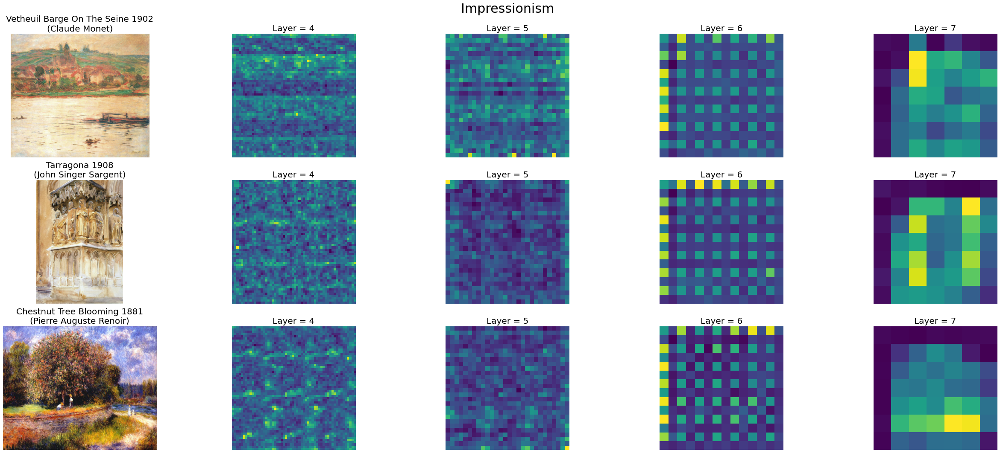

Style Early_Renaissance
number_of_images 3


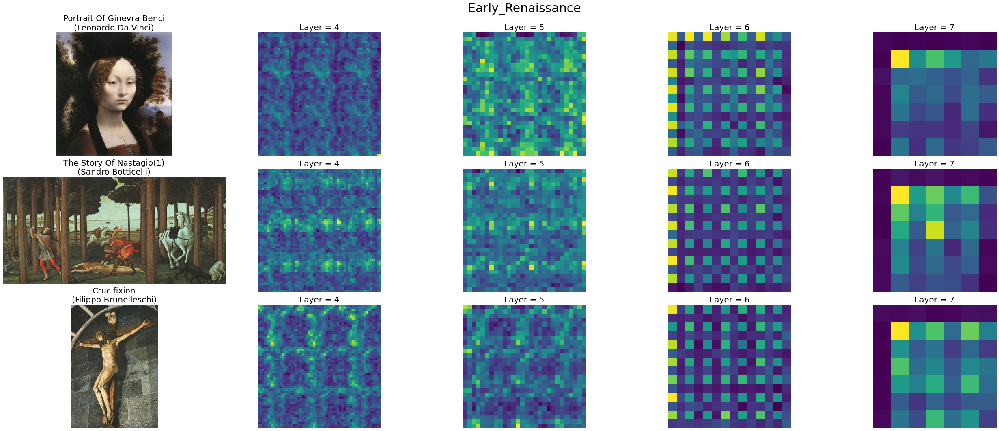

Style Pointillism
number_of_images 3


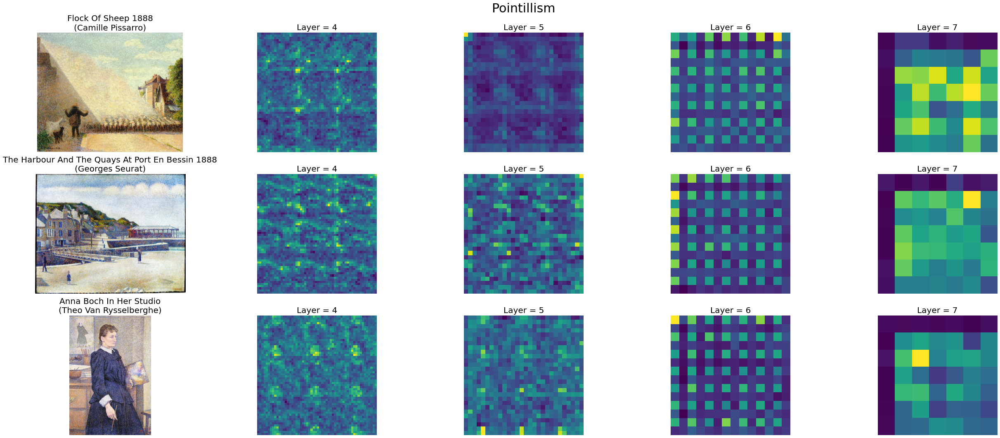

Style High_Renaissance
number_of_images 3


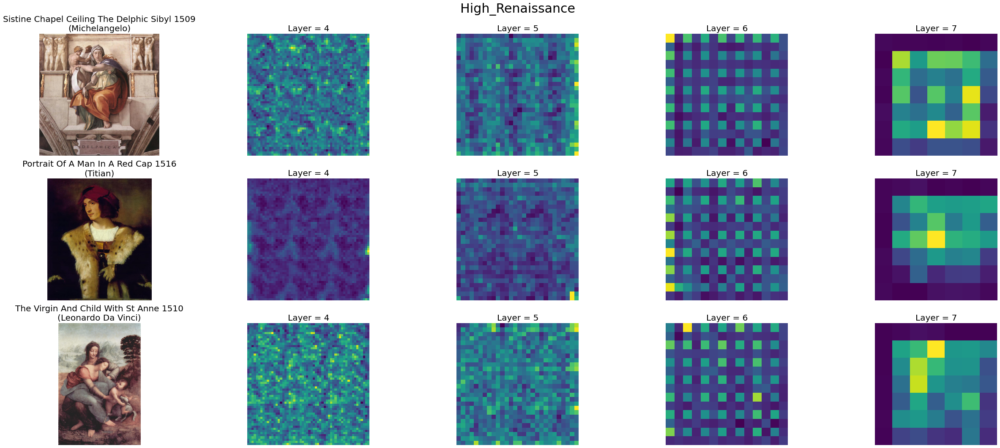

Style Minimalism
number_of_images 3


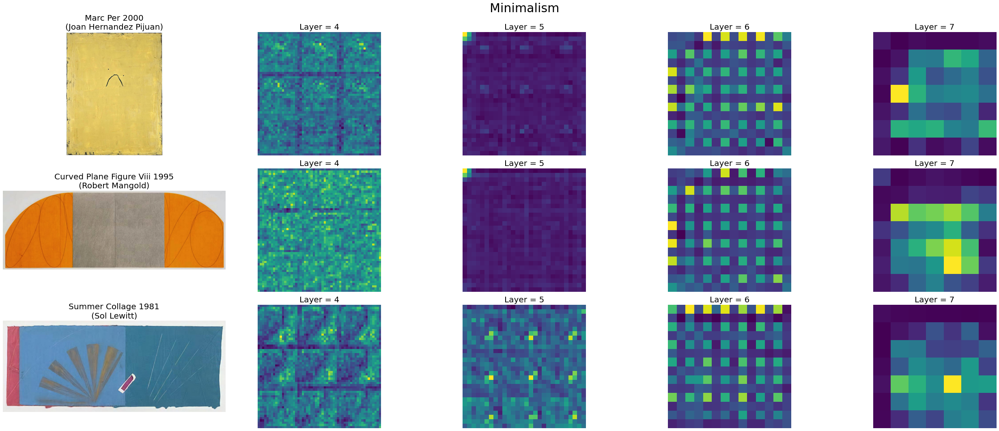

In [66]:
# Compare styles
for style in resulting_style_map.keys():
    print('Style', style)

    same_style_images = resulting_style_map[style]
    number_of_images = len(same_style_images)
    print('number_of_images', number_of_images)
    number_of_layers = len(same_style_images[0]['processed_feature_maps'])
    fig, axes = plt.subplots(nrows=number_of_images, ncols=number_of_layers + 1, figsize=(36,15))
    for idx, image_data in enumerate(same_style_images):
        feature_maps = image_data['processed_feature_maps']
        feature_map_names = image_data['feature_map_names']
        image_name = image_data['image_name']
        artist, title = get_art_info(image_name)

        axes[idx, 0].imshow(image_data['image'])
        axes[idx, 0].set_title(f'{title}\n({artist})', fontsize=20)
        axes[idx, 0].axis("off")
        for i in range(number_of_layers):
            axes[idx, i + 1].imshow(feature_maps[i])
            axes[idx, i + 1].axis("off")
            axes[idx, i + 1].set_title(f'Layer = {feature_map_names[i]}', fontsize=20)

    fig.suptitle(style, fontsize=30)
    fig.tight_layout()
    fig.savefig(f"output/{model_name}/feature_layers{filename_suffix}_{style}.jpg", dpi = 300, bbox_inches = 'tight')
    plt.show()
    